# Networks

This lesson introduces the network data structure.  Aspects of this lesson are adapted from Andrew Brooks' tutorial on graph optimization.  

https://www.datacamp.com/community/tutorials/networkx-python-graph-tutorial

It also draws from theory material presented at PyCon 2015 by Celia La and Sarah Guido.  

https://github.com/sarguido/networkx-tutorial

You will need to install two packages:

pip install networkx
pip install imageio

The networkx documentation is here: 

https://networkx.github.io/

In [1]:
!pip install networkx
!pip install imageio

In [2]:
# imports
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

%matplotlib inline

# Intro to NetworkX

### Adding & editing graph nodes

We'll first take a look at creating a graph, and adding/editing nodes:

In [3]:
import networkx as nx

'''use g = nx.Graph() to create a graph'''

g = nx.Graph()

'''Lesson: use .add_node(1) to add a single node'''
g.add_node(1)

'''Lesson: use .add_nodes_from([2, 3, 'four', 5])  to add in bulk'''
g.add_nodes_from([2, 3, 'four', 5])

g.nodes()  # run g.nodes() to view the graph

NodeView((1, 2, 3, 'four', 5))

In [4]:
'''Note that NetworkX won't complain if we re-add pre-existing nodes'''

# TODO: try re-adding nodes to see what happens
g.add_node(3)

g.nodes()  # display nodes

NodeView((1, 2, 3, 'four', 5))

In [5]:
'''Lesson: remove syntax is similar to adding, eg:
        .remove_node()
        .remove_nodes_from()
'''

# TODO: try removing both 1) single nodes, 2) nodes in bulk
g.remove_node(3)
g.remove_nodes_from(['four',5])


g.nodes()  # display nodes

NodeView((1, 2))

### Adding & editing edges

In [6]:
h = nx.Graph()  # let's create a 2nd graph to play with edges

'''Lesson: to create an edge, just specify the 2 nodes that define it: 
        .add_edge('a','b')
    Note that those nodes also get added (no need to make them beforehand!)
'''

h.add_edge('a', 'b')


print('edges:', h.edges())  # see your new edge
print('nodes:', h.nodes())  # verify that new nodes were also added

edges: [('a', 'b')]
nodes: ['a', 'b']


### Visualizing graphs

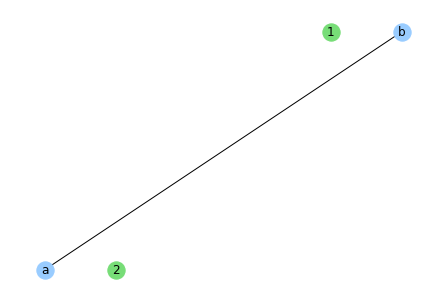

In [7]:

GREEN = "#77DD77"
BLUE = "#99CCFF"

nx.draw(g, node_color=GREEN, with_labels=True)
nx.draw(h, node_color=BLUE, with_labels=True)



#### How would you create the following graph?

<img src="img/graph.png" style="float:left" width="200" />

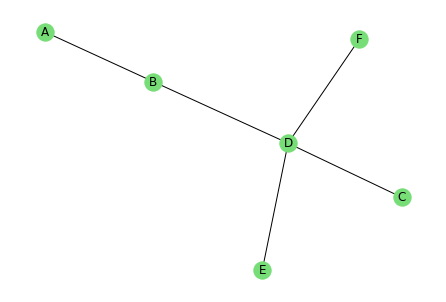

In [8]:
g = nx.Graph()

g.add_edges_from([('A','B'),('B','D'),('C','D'),('E','D'),('F','D')])
nx.draw(g, node_color=GREEN, with_labels=True)

# Directed graphs

directed edges: [(1, 2), (2, 3)]


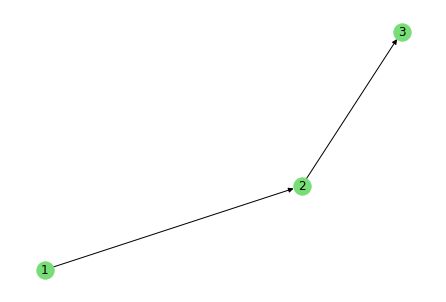

In [9]:
'''Lesson: use nx.DiGraph() to create a new directed graph
'''

dg = nx.DiGraph()


dg.add_edges_from([(1,2), (2,3)])

print('directed edges:', dg.edges())
nx.draw(dg, node_color=GREEN, with_labels=True)


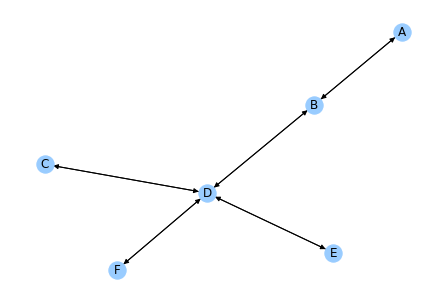

In [10]:
'''We can make directed graphs from existing graphs, eg:
        nx.DiGraph(g)
'''

dg = nx.DiGraph(g)


nx.draw(dg, node_color=BLUE, with_labels=True)

In [11]:
''' Notice that nodes A and B have TWO directed edges:
        A -> B
        B -> A
'''

dg.edges()

OutEdgeView([('A', 'B'), ('B', 'A'), ('B', 'D'), ('D', 'B'), ('D', 'C'), ('D', 'E'), ('D', 'F'), ('C', 'D'), ('E', 'D'), ('F', 'D')])

### Adding attributes to nodes and edges

Sometimes you may want to attach attributes to either the nodes or edges:

* Perhaps you want to save node properties that will be helpful with future analysis
* Perhaps you want to attach visual descriptions, such a node size, edge width or graph color

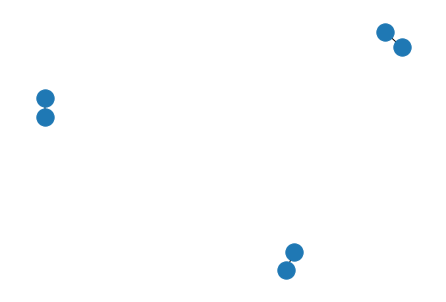

In [12]:
cities = nx.Graph()

cities.add_edge('San Diego', 'Los Angeles', distance = 0.4)
cities.add_edge('New York', 'Nashville',  distance = 5.6)
cities.add_edge('Boston', 'D.C.', distance = 0.8)

nx.draw(cities)

# Describing a network

### Degree Distribution:



<img src="img/graph.png" style="float:left; padding-right:20px;" width="200" />

- 1 node with 4 edges
- 1 node with 2 edges
- 4 nodes with 1 edge

Distribution:

    [(1:4), (1:2), (4:1)]


In [13]:
# Degree Distribution for all nodes
print('Degree Distribution:', g.degree())

Degree Distribution: [('A', 1), ('B', 2), ('D', 4), ('C', 1), ('E', 1), ('F', 1)]


In [14]:
# Generate the graph above
paths = nx.Graph()
paths.add_edges_from([
    ('A','B'), ('B','D'), ('B','C'), ('D','E'), ('D','C'),
    ('C','1'), ('1','2'), ('1','3'), ('2','3'), 
    ('E','2'), ('E','4')])

# Display average shortest path details
print('Avg shortest path from A to E is', nx.shortest_path_length(paths, 'A','E'), 'hops:')
print(nx.shortest_path(paths, 'A','E'))

Avg shortest path from A to E is 3 hops:
['A', 'B', 'D', 'E']


## Network Centrality (the higher result is better!)

* **Degree: number of edges** for node X
* **Betweenness: number of shortest paths** that pass through node X
* **Closeness: average of the shortest paths** between X and all other nodes

<img src="img/centrality1.png" style="float:left;" width="400" />
<img src="img/centrality2.png" style="float:left;" width="200" />



In [15]:
''' To calculate Degree Distribution for all nodes, use:
    g.degree()  for non-normalized values,
    nx.degree_centrality(g)   for normalized values
'''

# degree distrib., non-normalized
print('Degree Centrality:')
print(g.degree())

# TODO degree distrib., normalized
print('\nDegree Centrality, Normalized:')
print(nx.degree_centrality(g))


Degree Centrality:
[('A', 1), ('B', 2), ('D', 4), ('C', 1), ('E', 1), ('F', 1)]

Degree Centrality, Normalized:
{'A': 0.2, 'B': 0.4, 'D': 0.8, 'C': 0.2, 'E': 0.2, 'F': 0.2}


In [16]:
''' To calculate betweenness centrality, use:
    nx.betweenness_centrality(g, normalized=True/False)   default is True
'''

# betweenness centrality, non-normalized
print('Betweenness Centrality:')
print(nx.betweenness_centrality(g, normalized=False))

# betweenness centrality, normalized
print('\nBetweenness Centrality, Normalized:')
print(nx.betweenness_centrality(g, normalized=True))


Betweenness Centrality:
{'A': 0.0, 'B': 4.0, 'D': 9.0, 'C': 0.0, 'E': 0.0, 'F': 0.0}

Betweenness Centrality, Normalized:
{'A': 0.0, 'B': 0.4, 'D': 0.9, 'C': 0.0, 'E': 0.0, 'F': 0.0}


In [17]:
''' to calculate closeness centrality, use:
    nx.closeness_centrality(g)
'''

# find closeness centrality
print('Closeness Centrality:')
print(nx.closeness_centrality(g))

Closeness Centrality:
{'A': 0.4166666666666667, 'B': 0.625, 'D': 0.8333333333333334, 'C': 0.5, 'E': 0.5, 'F': 0.5}


# Back to Airline Networks

Previously we used open flights to examine airline routes around the world.  We found that it was a bit of a pain to store the data in tables, and merge different information.  We can model it as network instead.  I've cleaned the data up a bit, and selected out only the routes operated by Delta, making it a bit more managable.  


In [18]:
# read the data
routes = pd.read_csv('data/delta_routes.csv')
routes.head()

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest
0,0,DL,2009.0,ABE,4355.0,ATL,3682.0,NaN,0,717,40.652100,-75.440804,33.636700,-84.428101
1,1,DL,2009.0,ABQ,4019.0,ATL,3682.0,NaN,0,757 320,35.040199,-106.609001,33.636700,-84.428101
2,2,DL,2009.0,ABQ,4019.0,MSP,3858.0,NaN,0,320,35.040199,-106.609001,44.882000,-93.221802
3,3,DL,2009.0,ACC,248.0,JFK,3797.0,NaN,0,76W,5.605190,-0.166786,40.639801,-73.778900
4,4,DL,2009.0,ACC,248.0,ROB,1063.0,NaN,0,76W,5.605190,-0.166786,6.233790,-10.362300


### As a review, let's build an interactive map to see what this looks like



In [19]:
import pyproj
import folium

In [20]:

# when creating a function, it is good practice to define the API!
def getGreatCirclePoints(startlat, startlon, endlat, endlon): 
    """
    startlat - starting latitude 
    startlon - starting longitude 
    endlat   - ending latitude 
    endlon   - ending longitude 
    
    returns - a list of tuples, where each tuple is the lat-long for a point
              along the curve.  
    """
    # calculate distance between points
    g = pyproj.Geod(ellps='WGS84')
    (az12, az21, dist) = g.inv(startlon, startlat, endlon, endlat)

    # calculate line string along path with segments <= 20 km
    lonlats = g.npts(startlon, startlat, endlon, endlat,
                     1 + int(dist / 20000))

    # the npts function uses lon-lat, while the folium functions use lat-lon
    # This sort of thing is maddening!  What happens is the lines don't show
    # up on the map and you don't know why.  Learn from my mistakes
    latlons = []
    for lon_lat in lonlats: 
        
        # this is how you get values out of a tuple
        (lon, lat) = lon_lat
        
        # add them to our list
        latlons.append((lat, lon)) 
    
    # npts doesn't include start/end points, so prepend/append them
    latlons.insert(0, (startlat, startlon))
    latlons.append((endlat, endlon))
    
    return latlons


In [21]:
# create a basic map, centered on Lexington
m = folium.Map(
    location=[38.034,-84.500],
    tiles='Stamen Toner',
    zoom_start=4
)

In [22]:
# define the map in the same way, but use great circles for the lines

# Define some empty sets
airport_set = set()
route_set = set()

# Make sure we don't add duplicates, especially for the origins
for name, row in routes.iterrows():
    
    if row['source'] not in airport_set: 
        popup_string = row['source']
        marker = folium.CircleMarker([row["latitude_source"], row["longitude_source"]], 
                                     color='DarkCyan',
                                     fill_color='DarkCyan', 
                                     radius=5, popup=popup_string)
        marker.add_to(m)
        airport_set.add(row['source'])
        
    if row['dest'] not in airport_set: 
        popup_string = row['dest']
        marker = folium.CircleMarker([row["latitude_dest"], row["longitude_dest"]], 
                                     color='MidnightBlue',
                                     fill_color='MidnightBlue', 
                                     radius=5, popup=popup_string)
        marker.add_to(m)
        airport_set.add(row['dest'])
    
    # PolyLine will accept a whole list of tuples, not just two
    if (row['source'],row['dest']) not in route_set:            
        popup_string = row['source'] + '-' + row['dest']       
        
        gc_points = getGreatCirclePoints(row["latitude_source"], 
                                         row["longitude_source"], 
                                         row["latitude_dest"], 
                                         row["longitude_dest"])
        
        line = folium.PolyLine(gc_points, weight=2, popup=popup_string)
        line.add_to(m)
        route_set.add((row['source'],row['dest']))
        

In [23]:
# save it to its own file
m.save("delta.html")
m

# Homework

1. Represent the Delta flights as a network.  What are the nodes?  What are the links?
2. Which is the most important airport in Delta's network?  Support your answer using appropriate network metrics.  
3. How many flights are needed to reach Honolulu?  
4. What is the maximum number of flights needed to reach any destination in Delta's network?
5. Convert the network into a weighted network, using the travel time as the weight.  Assume that planes fly at 500 mph, plus 30 minutes to take off + 30 minutes to land.  
6. How long does it take to travel to Honolulu, in flight times.  

In [24]:
#Question 1
routes

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest
0,0,DL,2009.0,ABE,4355.0,ATL,3682.0,NaN,0,717,40.652100,-75.440804,33.636700,-84.428101
1,1,DL,2009.0,ABQ,4019.0,ATL,3682.0,NaN,0,757 320,35.040199,-106.609001,33.636700,-84.428101
2,2,DL,2009.0,ABQ,4019.0,MSP,3858.0,NaN,0,320,35.040199,-106.609001,44.882000,-93.221802
3,3,DL,2009.0,ACC,248.0,JFK,3797.0,NaN,0,76W,5.605190,-0.166786,40.639801,-73.778900
4,4,DL,2009.0,ACC,248.0,ROB,1063.0,NaN,0,76W,5.605190,-0.166786,6.233790,-10.362300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141,1141,DL,2009.0,YUL,146.0,LGA,3697.0,NaN,0,ERJ CR7,45.470600,-73.740799,40.777199,-73.872597
1142,1142,DL,2009.0,YYC,178.0,MSP,3858.0,NaN,0,319,51.113899,-114.019997,44.882000,-93.221802
1143,1143,DL,2009.0,YYZ,193.0,ATL,3682.0,NaN,0,NaN,43.677200,-79.630600,33.636700,-84.428101
1144,1144,DL,2009.0,YYZ,193.0,JFK,3797.0,NaN,0,CR7 ERJ,43.677200,-79.630600,40.639801,-73.778900


In [25]:
'''
representimg delta's flights as a network
the edges will be the routes from sources to dest
'''
e = nx.DiGraph()
edges = routes[['source', 'dest']].values #defining edges as the list of sources and destinations

e.add_edges_from(edges) #adding edges to e

print('directed edges:', e.edges()) 
print('nodes:', e.nodes()) 


directed edges: [('ABE', 'ATL'), ('ATL', 'ABE'), ('ATL', 'ABQ'), ('ATL', 'AGS'), ('ATL', 'ALB'), ('ATL', 'AMS'), ('ATL', 'AUA'), ('ATL', 'AUS'), ('ATL', 'AVL'), ('ATL', 'BDA'), ('ATL', 'BDL'), ('ATL', 'BHM'), ('ATL', 'BNA'), ('ATL', 'BOG'), ('ATL', 'BON'), ('ATL', 'BOS'), ('ATL', 'BRU'), ('ATL', 'BSB'), ('ATL', 'BTR'), ('ATL', 'BUF'), ('ATL', 'BWI'), ('ATL', 'BZE'), ('ATL', 'CAE'), ('ATL', 'CAK'), ('ATL', 'CCS'), ('ATL', 'CDG'), ('ATL', 'CHA'), ('ATL', 'CHS'), ('ATL', 'CLE'), ('ATL', 'CLT'), ('ATL', 'CMH'), ('ATL', 'COS'), ('ATL', 'CRW'), ('ATL', 'CUN'), ('ATL', 'CVG'), ('ATL', 'CZM'), ('ATL', 'DAB'), ('ATL', 'DAY'), ('ATL', 'DCA'), ('ATL', 'DEN'), ('ATL', 'DFW'), ('ATL', 'DSM'), ('ATL', 'DTW'), ('ATL', 'DUB'), ('ATL', 'DUS'), ('ATL', 'DXB'), ('ATL', 'ECP'), ('ATL', 'ELP'), ('ATL', 'EWR'), ('ATL', 'EYW'), ('ATL', 'EZE'), ('ATL', 'FAY'), ('ATL', 'FCO'), ('ATL', 'FLL'), ('ATL', 'FNT'), ('ATL', 'FPO'), ('ATL', 'FRA'), ('ATL', 'GCM'), ('ATL', 'GDL'), ('ATL', 'GIG'), ('ATL', 'GNV'), ('ATL',

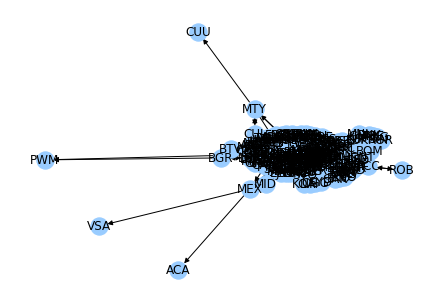

In [26]:
#directed graph of the delta network
nx.draw(e, node_color=BLUE, with_labels=True)

In [27]:
#Question 2
'''''
The degree distribution gives the breakdown of how many edges each node has
So here, it describes how many delta routes pass through each airport
'''''
print('Degree Distribution:', e.degree())

Degree Distribution: [('ABE', 2), ('ATL', 337), ('ABQ', 4), ('MSP', 120), ('ACC', 4), ('JFK', 153), ('ROB', 2), ('AGS', 2), ('ALB', 2), ('AMS', 18), ('BOM', 2), ('BOS', 33), ('DTW', 153), ('EWR', 12), ('PDX', 14), ('SEA', 28), ('ANC', 4), ('SLC', 86), ('AUA', 6), ('AUS', 9), ('AVL', 2), ('BDA', 6), ('BDL', 6), ('BHM', 2), ('BNA', 7), ('BOG', 4), ('BON', 2), ('BRU', 4), ('BSB', 2), ('BTR', 2), ('BUF', 7), ('BWI', 12), ('BZE', 4), ('CAE', 2), ('CAK', 2), ('CCS', 2), ('CDG', 25), ('CHA', 2), ('CHS', 7), ('CLE', 6), ('CLT', 11), ('CMH', 10), ('COS', 2), ('CRW', 2), ('CUN', 22), ('CVG', 45), ('CZM', 2), ('DAB', 2), ('DAY', 5), ('DCA', 9), ('DEN', 12), ('DFW', 13), ('DSM', 2), ('DUB', 4), ('DUS', 2), ('DXB', 2), ('ECP', 2), ('ELP', 2), ('EYW', 4), ('EZE', 2), ('FAY', 2), ('FCO', 5), ('FLL', 12), ('FNT', 2), ('FPO', 2), ('FRA', 6), ('GCM', 4), ('GDL', 6), ('GIG', 2), ('GNV', 2), ('GPT', 2), ('GRR', 8), ('GRU', 6), ('GSO', 3), ('GSP', 2), ('GUA', 6), ('HNL', 18), ('HOU', 2), ('HSV', 2), ('IAD'

In [28]:
'''
Since Atlanta has the most edges of 337, we would say that it is the most important airport
in Delta's network
'''
print('The most important airport in Delta network is Atlanta with', e.degree('ATL'), 'routes' )

The most important airport in Delta network is Atlanta with 337 routes


In [29]:
#Question 3
#number of flights needed to reach honolulu
print('Avg shortest path from Lex to honolulu is', nx.shortest_path_length(e, 'LEX','HNL'), 'flights:')
print(nx.shortest_path(e, 'LEX','HNL'))

Avg shortest path from Lex to honolulu is 2 flights:
['LEX', 'ATL', 'HNL']


In [30]:
#Question 4: What is the maximum number of flights needed to reach any destination in Delta's network?
# making a loop to iterate through different number of flights
source = routes['source']
dest = routes ['dest']
maxnumber_flights = 1
for i in source:
    for j in dest:
        flightnumber = nx.shortest_path_length(e, i, j)
        if flightnumber > maxnumber_flights:
            maxnumber_flights = flightnumber
            print('Maximum number of flights needed to reach any destination is', flightnumber)
        else:
            pass
            


Maximum number of flights needed to reach any destination is 2
Maximum number of flights needed to reach any destination is 4
Maximum number of flights needed to reach any destination is 5


In [31]:
#Question 5:Convert the network into a weighted network, using the travel time as the weight.
#Assume that planes fly at 500 mph, plus 30 minutes to take off + 30 minutes to land.
#second way of finding distance
!pip install haversine
import haversine as hs
!pip install geopy
import geopy.distance

In [94]:
from haversine import haversine, Unit
'''
calc_distance function makes use of the haversine function to calculate the distances from the longitudes and latitudes
of the sources and destinations from the routes dataframe. It then returns this results and adds it as a new column
called distance to the routes datafram. So this represents the distnace in miles from one location to the other
'''
def calc_distance(x):
    dist =  haversine((x["latitude_source"],x["longitude_source"]),(x["latitude_dest"],x["longitude_dest"]), unit = Unit.MILES)
    return dist
routes["distance"] = routes.apply(calc_distance,axis=1)
routes

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest,distance,traveltime
0,0,DL,2009.0,ABE,4355.0,ATL,3682.0,NaN,0,717,40.652100,-75.440804,33.636700,-84.428101,692.054325,2.384109
1,1,DL,2009.0,ABQ,4019.0,ATL,3682.0,NaN,0,757 320,35.040199,-106.609001,33.636700,-84.428101,1266.563376,3.533127
2,2,DL,2009.0,ABQ,4019.0,MSP,3858.0,NaN,0,320,35.040199,-106.609001,44.882000,-93.221802,979.923841,2.959848
3,3,DL,2009.0,ACC,248.0,JFK,3797.0,NaN,0,76W,5.605190,-0.166786,40.639801,-73.778900,5108.605713,11.217211
4,4,DL,2009.0,ACC,248.0,ROB,1063.0,NaN,0,76W,5.605190,-0.166786,6.233790,-10.362300,702.018000,2.404036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141,1141,DL,2009.0,YUL,146.0,LGA,3697.0,NaN,0,ERJ CR7,45.470600,-73.740799,40.777199,-73.872597,324.351116,1.648702
1142,1142,DL,2009.0,YYC,178.0,MSP,3858.0,NaN,0,319,51.113899,-114.019997,44.882000,-93.221802,1048.882354,3.097765
1143,1143,DL,2009.0,YYZ,193.0,ATL,3682.0,NaN,0,NaN,43.677200,-79.630600,33.636700,-84.428101,740.102003,2.480204
1144,1144,DL,2009.0,YYZ,193.0,JFK,3797.0,NaN,0,CR7 ERJ,43.677200,-79.630600,40.639801,-73.778900,365.737185,1.731474


In [89]:
'''
weight is the travel time which is equal to distance / speed
distance will be found from the latitude and longitude of sources and dests
speed is 50 mph and 1 hour will be added to the time to include take off and landing
'''

speed = 500 #mph
takeoff_plus_landing = 1 #hour
distance = routes['distance']
for i in range(len(distance)):
    routes['traveltime'] = (distance / speed) + takeoff_plus_landing
    

routes

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest,distance,traveltime
0,0,DL,2009.0,ABE,4355.0,ATL,3682.0,NaN,0,717,40.652100,-75.440804,33.636700,-84.428101,692.054325,2.384109
1,1,DL,2009.0,ABQ,4019.0,ATL,3682.0,NaN,0,757 320,35.040199,-106.609001,33.636700,-84.428101,1266.563376,3.533127
2,2,DL,2009.0,ABQ,4019.0,MSP,3858.0,NaN,0,320,35.040199,-106.609001,44.882000,-93.221802,979.923841,2.959848
3,3,DL,2009.0,ACC,248.0,JFK,3797.0,NaN,0,76W,5.605190,-0.166786,40.639801,-73.778900,5108.605713,11.217211
4,4,DL,2009.0,ACC,248.0,ROB,1063.0,NaN,0,76W,5.605190,-0.166786,6.233790,-10.362300,702.018000,2.404036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141,1141,DL,2009.0,YUL,146.0,LGA,3697.0,NaN,0,ERJ CR7,45.470600,-73.740799,40.777199,-73.872597,324.351116,1.648702
1142,1142,DL,2009.0,YYC,178.0,MSP,3858.0,NaN,0,319,51.113899,-114.019997,44.882000,-93.221802,1048.882354,3.097765
1143,1143,DL,2009.0,YYZ,193.0,ATL,3682.0,NaN,0,NaN,43.677200,-79.630600,33.636700,-84.428101,740.102003,2.480204
1144,1144,DL,2009.0,YYZ,193.0,JFK,3797.0,NaN,0,CR7 ERJ,43.677200,-79.630600,40.639801,-73.778900,365.737185,1.731474


In [111]:
#Question 6 How long does it take to travel to Honolulu, in flight times.
#Avg shortest path from Lex to honolulu is 2 flights:['LEX', 'ATL', 'HNL']
routes[routes['source'] == 'LEX'] 

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest,distance,traveltime
658,658,DL,2009.0,LEX,4017.0,ATL,3682.0,NaN,0,M88 717,38.036499,-84.605904,33.636700,-84.428101,304.160073,1.60832
659,659,DL,2009.0,LEX,4017.0,LGA,3697.0,NaN,0,ERJ,38.036499,-84.605904,40.777199,-73.872597,603.004957,2.20601


In [112]:
routes[routes['dest'] == 'HNL'] 

,Unnamed: 0,airline,airline_id,source,source_id,dest,dest_id,codeshare,stops,equipment,latitude_source,longitude_source,latitude_dest,longitude_dest,distance,traveltime
84,84,DL,2009.0,ATL,3682.0,HNL,3728.0,NaN,0,333,33.636700,-84.428101,21.318701,-157.921997,4494.895400,9.989791
451,451,DL,2009.0,FUK,2305.0,HNL,3728.0,NaN,0,76W,33.585899,130.451004,21.318701,-157.921997,4389.512701,9.779025
609,609,DL,2009.0,KIX,3992.0,HNL,3728.0,NaN,0,333,34.427299,135.244003,21.318701,-157.921997,4109.735108,9.219470
635,635,DL,2009.0,LAX,3484.0,HNL,3728.0,NaN,0,76W 757 753,33.942501,-118.407997,21.318701,-157.921997,2552.673085,6.105346
866,866,DL,2009.0,NGO,3942.0,HNL,3728.0,NaN,0,76W,34.858398,136.804993,21.318701,-157.921997,4018.504694,9.037009
873,873,DL,2009.0,NRT,2279.0,HNL,3728.0,NaN,0,744 76W 333,35.764702,140.386002,21.318701,-157.921997,3812.869114,8.625738
1014,1014,DL,2009.0,SEA,3577.0,HNL,3728.0,NaN,0,753,47.449001,-122.308998,21.318701,-157.921997,2676.827764,6.353656
1026,1026,DL,2009.0,SFO,3469.0,HNL,3728.0,NaN,0,753,37.618999,-122.375000,21.318701,-157.921997,2396.523372,5.793047
1060,1060,DL,2009.0,SLC,3536.0,HNL,3728.0,NaN,0,763,40.788399,-111.977997,21.318701,-157.921997,2990.720271,6.981441


In [ ]:
#question 6 solution
'''
From question 3, we can travel to honolulu using the route from lex to atl to HNL
LEX to ATL IS 1.6 hours, ATL to HNL is 9.9 hours
so it will take approximately 11.6 hours to travel to Honolulu
'''

In [120]:
#Tried using this way to find question 6, but no luck
a = nx.DiGraph()

a.add_edge(routes['source'], routes['dest'], routes['traveltime']) #adding edges to e

print('Avg shortest path from Lex to honolulu is', nx.shortest_path(a, 'LEX','HNL', weight ='traveltime'), 'hours:')


TypeError: add_edge() takes 3 positional arguments but 4 were given